# Maxence Gélard

maxence.gelard@student-cs.fr


## Visualization of CNN: Grad-CAM

* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.

* **To be submitted by next session**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!

* NB: if `PIL` is not installed, try `conda install pillow`.


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [2]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)

In [3]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl') )

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [4]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)


inv_normalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.255],
    std=[1/0.229, 1/0.224, 1/0.255]
)

In [5]:
# The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# otherwise the function won't find them

import os

if not os.path.isdir("data"):
    os.mkdir("data")
    os.mkdir("data/TP2_images")
    !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2022/TP2/TP2_images.zip" && unzip TP2_images.zip
dir_path = "data/" 
dataset = preprocess_image(dir_path)

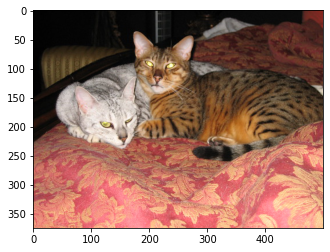

In [6]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [7]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.077123  10.977326  10.5543785]


### Grad-CAM 
* **Overview:** Given an image, and a category ("tiger cat") as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully. 
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

![Grad-CAM](https://da2so.github.io/assets/post_img/2020-08-10-GradCAM/2.png)

In [8]:
class GradCAM:
    def __init__(self, model: models.resnet34, last_convolutionnal_layer, target_size=(224, 224)):
        self.model = model
        self.target_size = target_size
        
        self.hook_saved_tensors = {
            "last_feature_map": None,
            "last_conv_gradient": None
        }
        
        self.last_convolutionnal_layer = last_convolutionnal_layer
        self.last_convolutionnal_layer.register_forward_hook(self.forward_hook)
        self.last_convolutionnal_layer.register_backward_hook(self.backward_hook)
    
    def generate_activation_map(self, image):
        # Forward progagate the image in the network
        # and get top 3 labels.
        predictions = self.model(image).squeeze()
        best_predictions, labels = torch.topk(predictions, k=3)
        last_feature_map = self.hook_saved_tensors["last_feature_map"].detach().squeeze()
        
        width, height = last_feature_map.shape[1:]
        n_labels = predictions.shape[0]
        
        heatmaps = {}
        
        for i, label in enumerate(labels.squeeze()):
            # Backpropagate to only get the gradient of 
            # the corresponding class prediction with respect
            # to last convolutional's activations
            class_prediction = predictions[label]
            
            self.model.zero_grad()
            one_hot_gradient = torch.zeros(n_labels)
            one_hot_gradient[label] = 1
            predictions.backward(one_hot_gradient, retain_graph=True)
            gradients = self.hook_saved_tensors["last_conv_gradient"][0].detach().squeeze()

            # Compute importance of each features for this label class
            alpha = torch.mean(gradients, dim=[1, 2])
            
            #Compute pixels importance
            pixels_importance = torch.sum(
                torch.multiply(alpha.view(-1,1,1), last_feature_map),
                dim=0,
            )
            
            #heatmap for a given class label
            relu_heatmap = torch.nn.ReLU()(pixels_importance)
            projected_heatmap = self.project_heatmap(relu_heatmap.view(1, 1, width, height)).squeeze()
            heatmaps[i] = projected_heatmap
        return heatmaps, labels, best_predictions
    
    def project_heatmap(self, heatmap, mode="bilinear"):
        return nn.functional.interpolate(heatmap, self.target_size, mode='bicubic', align_corners=False)
    
    def forward_hook(self, model, input_tensor, output_tensor):
        self.hook_saved_tensors["last_feature_map"] = output_tensor
    
    def backward_hook(self, model, input_grad, output_grad):
        self.hook_saved_tensors["last_conv_gradient"] = output_grad
        
    def plot_results(self, dataset):
        n_images = len(dataset)
        fig, ax = plt.subplots(n_images, 3, figsize=(20, 100))
        for i in range(n_images):
            image = dataset[i][0].view(1, 3, 224, 224)
            heatmaps, labels, best_predictions = self.generate_activation_map(image)
            for j in range(3):
                original_image = torch.clip(
                    torch.transpose(
                        torch.transpose(
                            inv_normalize(image).squeeze(), 0, 1
                        ), 1, 2
                ), 0, 1)
                ax[i, j].imshow(original_image)
                ax[i, j].imshow(heatmaps[j], cmap='rainbow', alpha=0.45)
                title_label = f"Label (top {j+1}): {classes[int(labels[j])]} \n"
                title_score = f"Score: {best_predictions[j]}"
                ax[i, j].set_title(title_label + title_score)
                ax[i, j].set_xticks([])
                ax[i, j].set_yticks([])

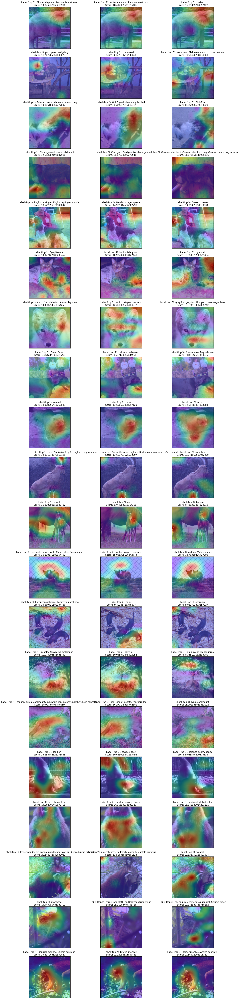

In [9]:
# Grad_CAM for the last rectified convolutionnal layer.

grad_CAM = GradCAM(resnet34, resnet34.layer4[-1].relu)
grad_CAM.plot_results(dataset)

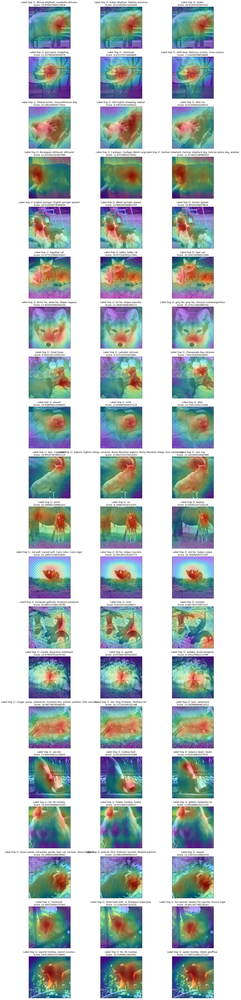

In [10]:
# For comparison, I have also computed
# Grad_CAM for the convolutionnal layer (which is followed by a BatchNormalization layer),
# but has not ReLu.

grad_CAM_2 = GradCAM(resnet34, resnet34.layer4[-1].bn2)
grad_CAM_2.plot_results(dataset)

### Comments on the results

First, let's focus on the main results (i.e the one we got we the last rectified convolutional layers). One can notice that globally, the regionq to which more importance are given always correspond to regions that focus on the animal and not on the background, meaning that the CNN, after a few convolutional layers, succeeded in understanding the location of the area that will help discriminating between animals. Moreover, one can also observe that the selected region often corresponds to a discriminative region. This is namely the case for the 10th image (image of Ibex), where the highest activations are obtained at the legs and the corns of the animal, which are really discriminative parts to detect such animal species.

Also, we observe two different type of behaviors. Firstly, similar activation maps for the top 3 labels often correspond to similar scores for this top 3 labels, meaning that the same region has been responsible for the decision to put high score for these 3 classes ; leading to higher uncertainty. This is namely the case for the 1st image (elephant), where high activations are present near the ear of the animal, leading to very similar scores for the classes "African elephant" and "Indian Elephant". In this case, the difficulty doesn't come from identifying which animal it is, but from which species it comes, and therefore it is not suprising that the model focuses on part that may help it to make the difference (here on the ears). Secondly, we have the other behavior in which different activation maps for the top 3 labels leads to very different scores, meaning that the model is quite certain about the result. This is namely the case 16th image (sea lion), for which the top 1 score is 3 points higher than the second score, and we indeed see that the model has focused on different region for the 3 different labels.

Finally, I wanted to compare what would be the difference if, instead of looking at the last rectified convolutionnal layer, I used the last convolutional layer which is not followed by ReLu (but by a BatchNormalization instead). Globally, the same observations can be made. The difference is that, because an additional convolution has been performed, we get "broader" regions, i.e localisation information are a bit less accurate, so the high activations regions correspond to more global regions than previously.

Thanks for reading!